In [44]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectKBest
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score, precision_score, roc_auc_score
import warnings
warnings.filterwarnings("ignore")

In [45]:
import pandas as pd

# Cargar los archivos en DataFrames
lc = pd.read_csv('../data/raw/lending_club_loan_two.csv')
lc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394274 non-null  object 
 15  

Configuro para ver el maximo de filas-columnas, de ser necesario

In [46]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
lc.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,Not Verified,Jan-2015,Fully Paid,vacation,Vacation,26.24,Jun-1990,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,Not Verified,Jan-2015,Fully Paid,debt_consolidation,Debt consolidation,22.05,Jul-2004,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,Source Verified,Jan-2015,Fully Paid,credit_card,Credit card refinancing,12.79,Aug-2007,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,Not Verified,Nov-2014,Fully Paid,credit_card,Credit card refinancing,2.60,Sep-2006,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,Verified,Apr-2013,Charged Off,credit_card,Credit Card Refinance,33.95,Mar-1999,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"


A continuación, la relación de columnas-features, con una pequeña descripción, de que tratan.

In [47]:
# loan_amnt: Monto del préstamo solicitado.
# term: Plazo del préstamo en meses.
# int_rate: Tasa de interés del préstamo.
# installment: Pago mensual del préstamo.
# grade: Grado asignado al préstamo por LendingClub (A, B, C, etc.).
# sub_grade: Subgrado asignado al préstamo por LendingClub (A1, A2, B1, etc.).
# emp_title: Título laboral del prestatario.
# emp_length: Antigüedad laboral del prestatario en años.
# home_ownership: Estado de propiedad de la vivienda del prestatario (RENT, OWN, MORTGAGE, OTHER).
# annual_inc: Ingreso anual del prestatario.
# verification_status: Estado de verificación del ingreso del prestatario.
# issue_d: Fecha en la que se emitió el préstamo.
# loan_status: Estado actual del préstamo (Fully Paid, Charged Off, etc.).
# purpose: Propósito del préstamo.
# title: Título del préstamo proporcionado por el prestatario.
# dti: Relación entre las deudas y el ingreso del prestatario.
# earliest_cr_line: Fecha en que se abrió la primera línea de crédito del prestatario.
# open_acc: Número de líneas de crédito abiertas en el archivo del prestatario.
# pub_rec: Número de registros públicos desfavorables.
# revol_bal: Saldo total de las cuentas de crédito renovable.
# revol_util: Tasa de utilización de las cuentas de crédito renovable.
# total_acc: Número total de cuentas de crédito del prestatario.
# initial_list_status: Estado inicial de la lista del préstamo (W, F).
# application_type: Tipo de aplicación (INDIVIDUAL, JOINT).
# mort_acc: Número de cuentas hipotecarias.
# pub_rec_bankruptcies: Número de quiebras en los registros públicos.
# address: Dirección del prestatario.

Seguidamente, un describe de las variables numéricas y sus stats.

In [48]:
lc.describe()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,396030.000000,396030.000000,396030.000000,3.960300e+05,396030.000000,396030.000000,396030.000000,3.960300e+05,395754.000000,396030.000000,358235.000000,395495.000000
mean,14113.888089,13.639400,431.849698,7.420318e+04,17.379514,11.311153,0.178191,1.584454e+04,53.791749,25.414744,1.813991,0.121648
std,8357.441341,4.472157,250.727790,6.163762e+04,18.019092,5.137649,0.530671,2.059184e+04,24.452193,11.886991,2.147930,0.356174
min,500.000000,5.320000,16.080000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,2.000000,0.000000,0.000000
25%,8000.000000,10.490000,250.330000,4.500000e+04,11.280000,8.000000,0.000000,6.025000e+03,35.800000,17.000000,0.000000,0.000000
50%,12000.000000,13.330000,375.430000,6.400000e+04,16.910000,10.000000,0.000000,1.118100e+04,54.800000,24.000000,1.000000,0.000000
75%,20000.000000,16.490000,567.300000,9.000000e+04,22.980000,14.000000,0.000000,1.962000e+04,72.900000,32.000000,3.000000,0.000000
max,40000.000000,30.990000,1533.810000,8.706582e+06,9999.000000,90.000000,86.000000,1.743266e+06,892.300000,151.000000,34.000000,8.000000


Compruebo, los valores únicos que contiene mi target(loan_status)

In [49]:
lc['loan_status'].unique()

array(['Fully Paid', 'Charged Off'], dtype=object)

Observo como de balanceada esta la target

In [50]:
lc['loan_status'].value_counts(normalize=True)

loan_status
Fully Paid     0.803871
Charged Off    0.196129
Name: proportion, dtype: float64

Compruebo que cantidad de instancias hay por cada uno de los años, entre 2009 y 2015, inclusives

In [51]:
# convierto issue_d a un objeto datetime
lc['issue_d'] = pd.to_datetime(lc['issue_d'], format='%b-%Y')

In [52]:
# Crear un diccionario para almacenar el conteo por año
conteo_por_año = {}

# Iterar sobre los años
for año in range(2009, 2016):
    # Filtrar el DataFrame para el año específico
    lc_año = lc[(lc['issue_d'].dt.year == año)]
    
    # Almacenar el conteo en el diccionario
    conteo_por_año[año] = len(lc_año)

# Mostrar el conteo por año
for año, conteo in conteo_por_año.items():
    print(f'Número de elementos para el año {año}: {conteo}')

Número de elementos para el año 2009: 3826
Número de elementos para el año 2010: 9258
Número de elementos para el año 2011: 17435
Número de elementos para el año 2012: 41202
Número de elementos para el año 2013: 97662
Número de elementos para el año 2014: 102860
Número de elementos para el año 2015: 94264


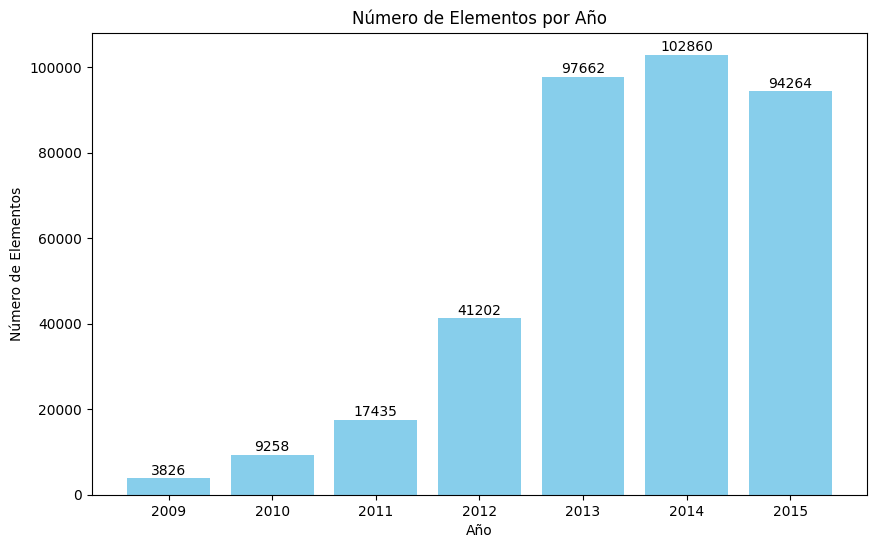

In [53]:
# Datos proporcionados
años = [2009, 2010, 2011, 2012, 2013, 2014, 2015]
elementos = [3826, 9258, 17435, 41202, 97662, 102860, 94264]

# Crear un gráfico de barras
plt.figure(figsize=(10, 6))
bars = plt.bar(años, elementos, color='skyblue')

# Configuración de etiquetas y título
plt.xlabel('Año')
plt.ylabel('Número de Elementos')
plt.title('Número de Elementos por Año')

# Agregar el valor de cada columna en la parte superior de la barra
for bar, valor in zip(bars, elementos):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 200, int(valor), ha='center', va='bottom')

# Mostrar el gráfico
plt.show()

Chequeo, cuantos valores nulos tengo en la columna de mort_acc, ya que quiero tener este dato, y que sea la muestra mas pequeña posible, para que sea manejable.-

In [54]:
# Crear un diccionario para almacenar el conteo por año y NaN en 'mort_acc'
conteo_por_año = {}
nan_por_año = {}

# Iterar sobre los años
for año in range(2009, 2016):
    # Filtrar el DataFrame para el año específico
    lc_año = lc[(lc['issue_d'].dt.year == año)]
    
    # Almacenar el conteo total en el diccionario
    conteo_por_año[año] = len(lc_año)
    
    # Contar los NaN en 'mort_acc'
    nan_en_mort_acc = lc_año['mort_acc'].isna().sum()
    nan_por_año[año] = nan_en_mort_acc

# Mostrar el conteo y los NaN por año
for año, conteo in conteo_por_año.items():
    nan_count = nan_por_año[año]
    print(f'Número de elementos para el año {año}: {conteo}, NaN en mort_acc: {nan_count}')

Número de elementos para el año 2009: 3826, NaN en mort_acc: 3826
Número de elementos para el año 2010: 9258, NaN en mort_acc: 9258
Número de elementos para el año 2011: 17435, NaN en mort_acc: 17435
Número de elementos para el año 2012: 41202, NaN en mort_acc: 5841
Número de elementos para el año 2013: 97662, NaN en mort_acc: 0
Número de elementos para el año 2014: 102860, NaN en mort_acc: 0
Número de elementos para el año 2015: 94264, NaN en mort_acc: 0


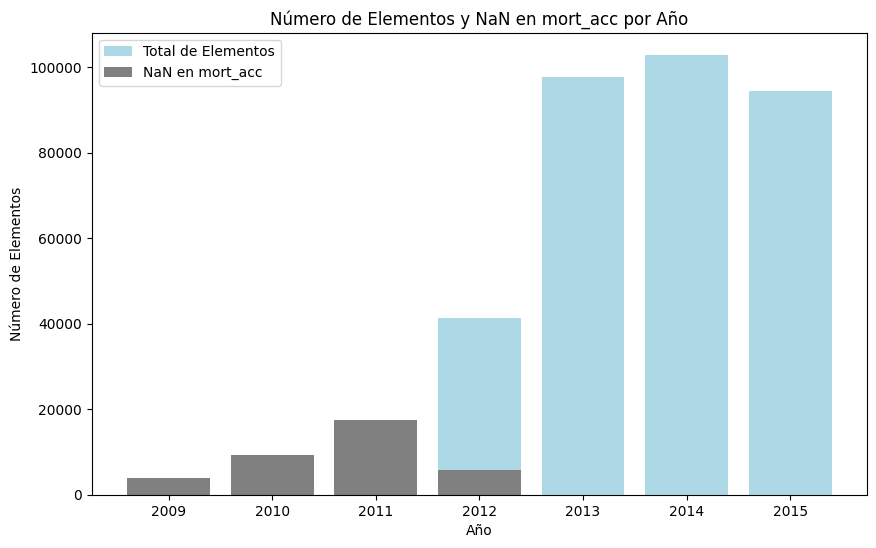

In [55]:
# Datos proporcionados
años = [2009, 2010, 2011, 2012, 2013, 2014, 2015]
elementos = [3826, 9258, 17435, 41202, 97662, 102860, 94264]
nan_en_mort_acc = [3826, 9258, 17435, 5841, 0, 0, 0]

# Calcular la proporción de NaN en mort_acc
proporcion_nan = np.array(nan_en_mort_acc) / np.array(elementos)

# Crear un gráfico de barras apilado
plt.figure(figsize=(10, 6))
plt.bar(años, elementos, color='lightblue', label='Total de Elementos')
plt.bar(años, nan_en_mort_acc, color='gray', label='NaN en mort_acc')

# Configuración de etiquetas y título
plt.xlabel('Año')
plt.ylabel('Número de Elementos')
plt.title('Número de Elementos y NaN en mort_acc por Año')
plt.legend()

# Mostrar el gráfico
plt.show()

In [56]:
# OJO PARA QUEDARME CON UN AÑO SOLO........ACHICAR MUESTRA Y SEA MAS MANEJABLE
# Me quedo con el 2012, por tener un tamaño medio entre los años iniciales y mantiene casi 
# todas las mort_acc que quiero tener en cuenta


# Guardo el año 2012 en una nueva df
# Filtrar el DataFrame para las fechas específicas
lc_2012 = lc[(lc['issue_d'] >= '2012-01-01') & (lc['issue_d'] <= '2012-12-31')]

In [57]:
# lo convierto a csv 

lc_2012.to_csv('../data/processed/lc_2012.csv', index=False)

Hago seguimiento de como va quedando el balanceo de la target, que sigo viendo que esta desbalanceada hacia el Fully Paid

In [58]:
lc_2012['loan_status'].value_counts(normalize=True)

loan_status
Fully Paid     0.835202
Charged Off    0.164798
Name: proportion, dtype: float64

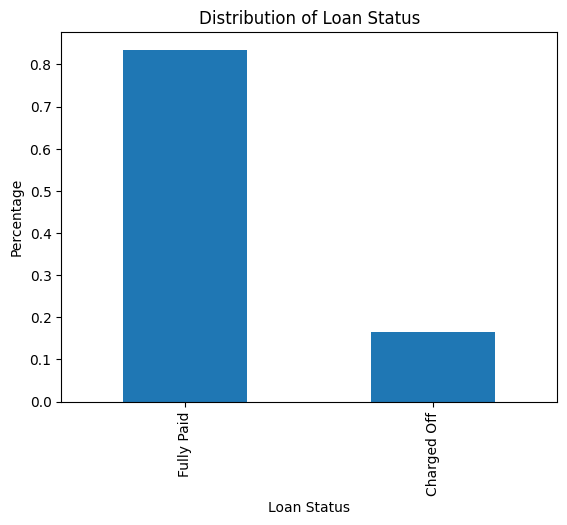

In [59]:
lc_2012['loan_status'].value_counts(normalize=True).plot(kind='bar')

# Configuración de etiquetas y título
plt.xlabel('Loan Status')
plt.ylabel('Percentage')
plt.title('Distribution of Loan Status')

# Muestra el gráfico
plt.show()

Cambio los valores de la variable 'loan_status', de Fully Paid y Charged Off, a 1 y 0, respectivamente

In [60]:
lc_2012['loan_status'] = lc_2012.loan_status.map({'Fully Paid':1, 'Charged Off':0})

In [61]:
lc_2012.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41202 entries, 7 to 396028
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   loan_amnt             41202 non-null  float64       
 1   term                  41202 non-null  object        
 2   int_rate              41202 non-null  float64       
 3   installment           41202 non-null  float64       
 4   grade                 41202 non-null  object        
 5   sub_grade             41202 non-null  object        
 6   emp_title             38725 non-null  object        
 7   emp_length            39691 non-null  object        
 8   home_ownership        41202 non-null  object        
 9   annual_inc            41202 non-null  float64       
 10  verification_status   41202 non-null  object        
 11  issue_d               41202 non-null  datetime64[ns]
 12  loan_status           41202 non-null  int64         
 13  purpose             

Tomo nota de las features con null values.-

5   sub_grade             41202 non-null  object        
 6   emp_title             38725 non-null  object ...............OJO       
 7   emp_length            39691 non-null  object .................OJO       
 8   home_ownership        41202 non-null  object        
 9   annual_inc            41202 non-null  float64       
 10  verification_status   41202 non-null  object        
 11  issue_d               41202 non-null  datetime64[ns]
 
 12  loan_status           41202 non-null  object        
 13  purpose               41202 non-null  object        
 14  title                 41201 non-null  object  ...................OJO      
 15  dti                   41202 non-null  float64       
 16  earliest_cr_line      41202 non-null  object        
 17  open_acc              41202 non-null  float64       
 18  pub_rec               41202 non-null  float64       
 19  revol_bal             41202 non-null  float64       
 20  revol_util            41169 non-null  float64 ...................OJO      
 21  total_acc             41202 non-null  float64       
 22  initial_list_status   41202 non-null  object        
 23  application_type      41202 non-null  object        
 24  mort_acc              35361 non-null  float64 ..................OJO      
 25  pub_rec_bankruptcies  41202 non-null  float64       
 26  address               41202 non-null  object    

<Axes: >

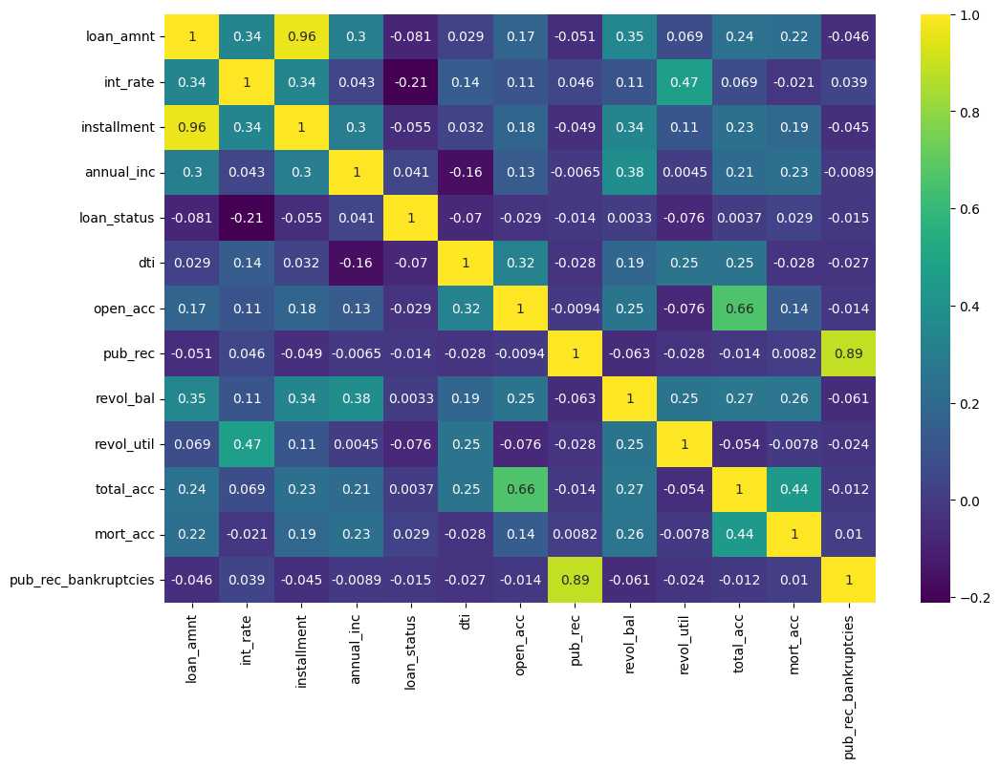

In [62]:
plt.figure(figsize=(12, 8))
sns.heatmap(lc_2012.corr(numeric_only=True), annot=True, cmap='viridis')

En el heatmap de correlación que aparece arriba de estas lineas, podemos hacer las siguientes apreciaciones, que tendremos en cuenta, a medida vaya avanzando este estudio(variables numéricas):

El capital solicitado(loan_amnt) tiene un 96 % de corr con la cuota(installment), normal la cuota esta determinada por pasar el capital por una fórmula matemática.

Las cuenta abiertas(open_acc) y totales(total_acc) estan relacionadas en un 66%, normal las abiertas estan en las totales.

Las quiebras(pub_rec_bankrupticies) y los registros desfavorables(pub_rec) se relacionan en un89%, normal las quiebras son desfavorables.

Los valores únicos de term(plazo), los convierto a sus valores numéricos

In [63]:
lc_2012.term.unique()

array([' 36 months', ' 60 months'], dtype=object)

In [64]:
# Para dejar solo el valor numerico del plazo de los prestamos
term_values = {' 36 months': 36, ' 60 months': 60}
lc_2012['term'] = lc_2012.term.map(term_values)

In [65]:
lc_2012.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
7,13000.0,36,11.14,426.47,B,B2,Office Depot,10+ years,RENT,46000.0,Not Verified,2012-09-01,1,credit_card,No More Credit Cards,26.87,Sep-1994,11.0,0.0,13425.0,64.5,15.0,f,INDIVIDUAL,0.0,0.0,USCGC Nunez\r\nFPO AE 30723
9,26300.0,36,16.29,928.40,C,C5,Regado Biosciences,3 years,MORTGAGE,115000.0,Verified,2012-04-01,1,debt_consolidation,Debt Consolidation,23.69,Dec-1997,13.0,0.0,22171.0,82.4,37.0,f,INDIVIDUAL,1.0,0.0,"3390 Luis Rue\r\nMauricestad, VA 00813"
14,25975.0,36,6.62,797.53,A,A2,Pullman Regional Hospital,9 years,MORTGAGE,65000.0,Verified,2012-10-01,1,small_business,Business,9.18,May-2001,9.0,0.0,5140.0,7.2,35.0,f,INDIVIDUAL,6.0,0.0,"0472 Weber Manors Apt. 660\r\nLake Andrew, NH ..."
75,13200.0,36,10.74,430.53,B,B2,Brookdale University Hospital,1 year,RENT,45000.0,Source Verified,2012-03-01,1,debt_consolidation,Honost Consolidation,12.80,May-1994,8.0,0.0,10665.0,75.6,10.0,f,INDIVIDUAL,0.0,0.0,"1741 Jackson Street Suite 615\r\nNew Jenny, MA..."
80,19000.0,36,12.12,632.17,B,B3,Broward Sheriff Office,8 years,RENT,48000.0,Source Verified,2012-07-01,1,debt_consolidation,Debt Loan,29.76,Jun-1994,12.0,0.0,30071.0,46.5,28.0,f,INDIVIDUAL,0.0,0.0,"58673 Foster Freeway\r\nPort Meredithville, NY..."


Observo, los únicos en cada una de las features categóricas, para plantear la posibilidad de quitar, hacer dummies, o algún tipo de transformación


In [66]:

data = {'emp_title': len(lc_2012['emp_title'].unique()),
        'emp_length': len(lc_2012['emp_length'].unique()),
        'home_ownership': len(lc_2012['home_ownership'].unique()),
        'purpose': len(lc_2012['purpose'].unique()),
        'pub_rec': len(lc_2012['pub_rec'].unique()),
        'total_acc': len(lc_2012['total_acc'].unique()),
        'initial_list_status': len(lc_2012['initial_list_status'].unique()),
        'mort_acc': len(lc_2012['mort_acc'].unique()),
        'pub_rec_bankruptcies': len(lc_2012['pub_rec_bankruptcies'].unique())
}
df_new = pd.DataFrame(data, index=[0])
df_new

,emp_title,emp_length,home_ownership,purpose,pub_rec,total_acc,initial_list_status,mort_acc,pub_rec_bankruptcies
0,30985,12,5,13,6,71,2,23,5


In [67]:
# mantener esta columna que los valores de la duracion en el trabajo
#  y la media en los nan.....en los demas su valor numerico
lc_2012.emp_length.unique()

array(['10+ years', '3 years', '9 years', '1 year', '8 years', '5 years',
       '6 years', '4 years', '2 years', '7 years', '< 1 year', nan],
      dtype=object)

In [68]:
# Mapa de reemplazo
emp_length_map = {
    '10+ years': 10,
    '9 years': 9,
    '8 years': 8,
    '7 years': 7,
    '6 years': 6,
    '5 years': 5,
    '4 years': 4,
    '3 years': 3,
    '2 years': 2,
    '1 year': 1,
    '< 1 year': 0
}

# Reemplazar los valores en la columna 'emp_length'
lc_2012['emp_length'] = lc_2012['emp_length'].replace(emp_length_map)

# Calcular la media de la columna 'emp_length' (excluyendo NaN)
media_emp_length = lc_2012['emp_length'].mean()

# Reemplazar NaN con la media de la columna
lc_2012['emp_length'] = lc_2012['emp_length'].fillna(media_emp_length)





Conteo de las instancias incluidas en cada categoria de duracion en empleo(emp_length)

In [69]:
lc_2012.emp_length.value_counts()

emp_length
10.000000    11707
2.000000      3824
5.000000      3515
0.000000      3213
4.000000      3043
3.000000      3030
6.000000      2883
1.000000      2848
7.000000      2359
8.000000      1806
5.740067      1511
9.000000      1463
Name: count, dtype: int64

Conteo de las instancias incluidas en cada categoria de proposito-titulo de la solicitud de la financiación, a que se va a emplear(title)

In [70]:
lc_2012.title.value_counts().head()

title
Debt consolidation         3465
Debt Consolidation         3180
Credit card refinancing    1011
debt consolidation          949
Consolidation               887
Name: count, dtype: int64

Conteo de las instancias incluidas en cada categoría de propósito-título de la solicitud de la financiación, a que se va a emplear(purpose)

In [71]:
lc_2012.purpose.value_counts().head()

purpose
debt_consolidation    23611
credit_card            8154
other                  2325
home_improvement       2210
small_business         1070
Name: count, dtype: int64

In [72]:
# Detecto que en title, hay una clasificación de los préstamos, mucho más amplia, cuando en purpose aglutina en una misma categoría, las iguales
# P.e. en la purpose (debt_consolidation), aglutina las de title como, Debt consolidation, Debt Consolidation,debt consolidation, etc....
# Estas columnas nos hablan de lo mismo los objetivos de las financiaciones, por lo que nos deshacemos de title

lc_2012.drop('title', axis=1, inplace=True)

El código que continua se trata de que para hacer el modelo, original, simple , quite todas esas categóricas. Pensando en un futuro poder plantear dummies, transformación que no se llevo a cabo.

In [73]:
# de momento no voy a crear estos posibles dummies, y voy a drop estas categoricas,
# para un acercamiento inicial a un modelo facil

# dummies = ['verification_status', 'purpose', 'initial_list_status', 
#            'application_type', 'home_ownership']
# lc_2012= pd.get_dummies(lc_2012, columns=dummies, drop_first=True)

# columnas_a_eliminar = ['verification_status', 'purpose', 'initial_list_status', 'application_type', 'home_ownership']

Las columnas verification_status y application_type, las desecho, al no ver ninguna relación por negocio en si se verifico o no la documentación,....y si la solicitud fue hecha individual o conjuntamente.

In [74]:


# Utiliza el método drop para eliminar las columnas
lc_2012 = lc_2012.drop(['verification_status','application_type'], axis=1)

In [75]:
lc_2012.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41202 entries, 7 to 396028
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   loan_amnt             41202 non-null  float64       
 1   term                  41202 non-null  int64         
 2   int_rate              41202 non-null  float64       
 3   installment           41202 non-null  float64       
 4   grade                 41202 non-null  object        
 5   sub_grade             41202 non-null  object        
 6   emp_title             38725 non-null  object        
 7   emp_length            41202 non-null  float64       
 8   home_ownership        41202 non-null  object        
 9   annual_inc            41202 non-null  float64       
 10  issue_d               41202 non-null  datetime64[ns]
 11  loan_status           41202 non-null  int64         
 12  purpose               41202 non-null  object        
 13  dti                 

Verifico los valores únicos de las subgrade.

In [76]:
lc_2012['sub_grade'].unique()

array(['B2', 'C5', 'A2', 'B3', 'G1', 'C2', 'B1', 'F5', 'A4', 'F1', 'B4',
       'D2', 'A1', 'E4', 'A3', 'C4', 'D3', 'B5', 'D4', 'D1', 'C1', 'E5',
       'C3', 'A5', 'E3', 'D5', 'E2', 'E1', 'F2', 'F3', 'F4', 'G2', 'G3',
       'G4', 'G5'], dtype=object)

In [77]:
# Infiero la mayor calidad crediticia a cada subgrade
# Mapeo de valores para la columna 'sub_grade'
sub_grade_map = {
    'A1': 35, 'A2': 34, 'A3': 33, 'A4': 32, 'A5': 31,
    'B1': 30, 'B2': 29, 'B3': 28, 'B4': 27, 'B5': 26,
    'C1': 25, 'C2': 24, 'C3': 23, 'C4': 22, 'C5': 21,
    'D1': 20, 'D2': 19, 'D3': 18, 'D4': 17, 'D5': 16,
    'E1': 15, 'E2': 14, 'E3': 13, 'E4': 12, 'E5': 11,
    'F1': 10, 'F2': 9, 'F3': 8, 'F4': 7, 'F5': 6,
    'G1': 5, 'G2': 4, 'G3': 3, 'G4': 2, 'G5': 1
}

# Reemplazar los valores en la columna 'sub_grade'
lc_2012['sub_grade'] = lc_2012['sub_grade'].replace(sub_grade_map)

Al ya tener, valorado la calidad crediticia de cada usuario en la discretización de sub_grade, elimino grade, ya que comprende la mismo info, y además más dispersa.

In [78]:
lc_2012.drop('grade', axis=1, inplace=True)

In [79]:
# Calcular la media de la columna 'mort_acc' (excluyendo NaN)
media_mort_acc = lc_2012['mort_acc'].mean()

# Reemplazar NaN con la media de la columna
lc_2012['mort_acc'] = lc_2012['mort_acc'].fillna(media_mort_acc)

In [80]:
lc_2012.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41202 entries, 7 to 396028
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   loan_amnt             41202 non-null  float64       
 1   term                  41202 non-null  int64         
 2   int_rate              41202 non-null  float64       
 3   installment           41202 non-null  float64       
 4   sub_grade             41202 non-null  int64         
 5   emp_title             38725 non-null  object        
 6   emp_length            41202 non-null  float64       
 7   home_ownership        41202 non-null  object        
 8   annual_inc            41202 non-null  float64       
 9   issue_d               41202 non-null  datetime64[ns]
 10  loan_status           41202 non-null  int64         
 11  purpose               41202 non-null  object        
 12  dti                   41202 non-null  float64       
 13  earliest_cr_line    

In [81]:
# revol_util  tiene..........41169 non-null  float64, o sea muy pocos null, los elimino
lc_2012 = lc_2012.dropna(subset=['revol_util'])

In [82]:
# No considero address determinante para este estudio, de momento
# La linea mas temprana en el historial crediticio del usuario, tampoco le doy valor,podria compararlo con la edad, si la tuviera
# issue_d la fecha de emision no es ponderable en si se impaga o no, a no ser que tuvieramos en cuenta ciclos económicos.
# por ello dropeo todas esas variables

lc_2012 = lc_2012.drop(['address','earliest_cr_line','issue_d'], axis=1)

In [83]:
lc_2012.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41169 entries, 7 to 396028
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   loan_amnt             41169 non-null  float64
 1   term                  41169 non-null  int64  
 2   int_rate              41169 non-null  float64
 3   installment           41169 non-null  float64
 4   sub_grade             41169 non-null  int64  
 5   emp_title             38694 non-null  object 
 6   emp_length            41169 non-null  float64
 7   home_ownership        41169 non-null  object 
 8   annual_inc            41169 non-null  float64
 9   loan_status           41169 non-null  int64  
 10  purpose               41169 non-null  object 
 11  dti                   41169 non-null  float64
 12  open_acc              41169 non-null  float64
 13  pub_rec               41169 non-null  float64
 14  revol_bal             41169 non-null  float64
 15  revol_util            4

<Axes: >

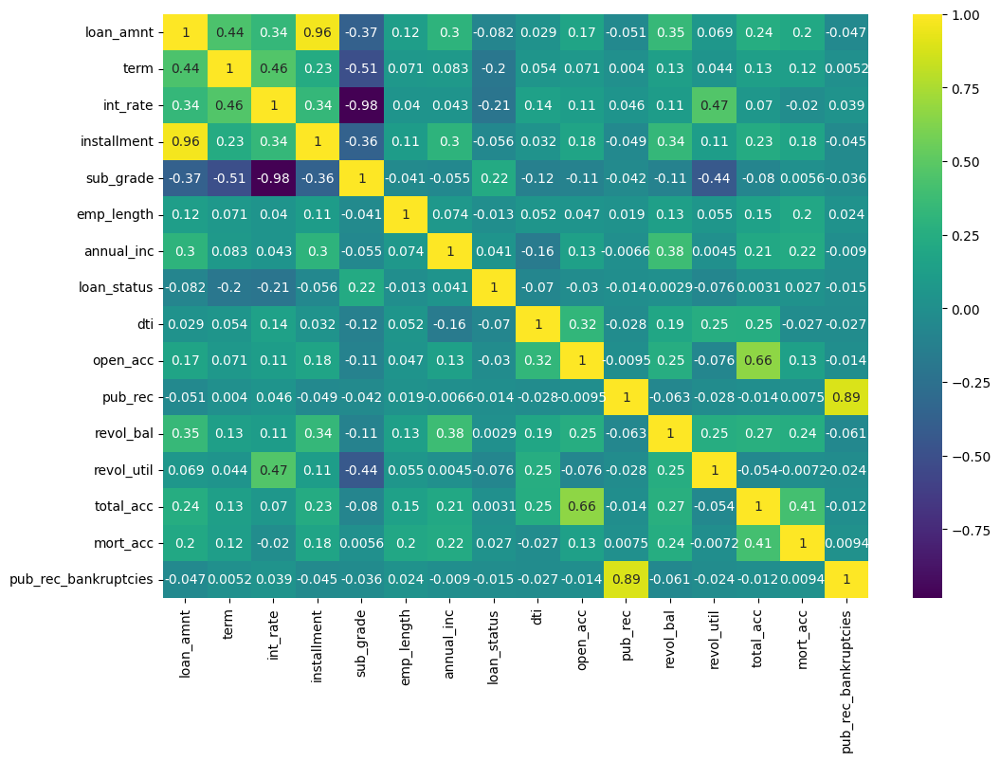

In [84]:
plt.figure(figsize=(12, 8))
sns.heatmap(lc_2012.corr(numeric_only=True), annot=True, cmap='viridis')

In [85]:
'''loan_amnt: Monto del préstamo solicitado.
int_rate: Tasa de interés del préstamo.
installment: Pago mensual del préstamo.
sub_grade: Subgrado asignado al préstamo por LendingClub (A1, A2, B1, etc.).
open_acc: Número de líneas de crédito abiertas en el archivo del prestatario.
pub_rec: Número de registros públicos desfavorables.
total_acc: Número total de cuentas de crédito del prestatario.
pub_rec_bankruptcies: Número de quiebras en los registros públicos.'''

# El interes y la subcategorizacion estan relacionados en un -98%, a mayor categoria menor tipo, quito subcategoria
# El capital solicitado tiene un 96 % de corr con la cuota, normal la cuota es segun el capital, quito capital
# Las cuenta abiertas y totales estan relacionadas en un 66%, normal las abiertas estan en las totales, quito las abiertas
# Las quiebras y los resgistros desfavorables se relacionan en un89%, normal las quiebras son desfavorables, quito las quiebras,
# Lo repense y no lo quite porque queria inferir en los modelos la relación de estar en quiebra y su influencia en la target, riesgo de impago

lc_2012 = lc_2012.drop(['sub_grade','loan_amnt','open_acc'], axis=1)

In [86]:
lc_2012.info()

<class 'pandas.core.frame.DataFrame'>
Index: 41169 entries, 7 to 396028
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   term                  41169 non-null  int64  
 1   int_rate              41169 non-null  float64
 2   installment           41169 non-null  float64
 3   emp_title             38694 non-null  object 
 4   emp_length            41169 non-null  float64
 5   home_ownership        41169 non-null  object 
 6   annual_inc            41169 non-null  float64
 7   loan_status           41169 non-null  int64  
 8   purpose               41169 non-null  object 
 9   dti                   41169 non-null  float64
 10  pub_rec               41169 non-null  float64
 11  revol_bal             41169 non-null  float64
 12  revol_util            41169 non-null  float64
 13  total_acc             41169 non-null  float64
 14  initial_list_status   41169 non-null  object 
 15  mort_acc              4

In [87]:
lc_2012.head()

,term,int_rate,installment,emp_title,emp_length,home_ownership,annual_inc,loan_status,purpose,dti,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mort_acc,pub_rec_bankruptcies
7,36,11.14,426.47,Office Depot,10.0,RENT,46000.0,1,credit_card,26.87,0.0,13425.0,64.5,15.0,f,0.0,0.0
9,36,16.29,928.40,Regado Biosciences,3.0,MORTGAGE,115000.0,1,debt_consolidation,23.69,0.0,22171.0,82.4,37.0,f,1.0,0.0
14,36,6.62,797.53,Pullman Regional Hospital,9.0,MORTGAGE,65000.0,1,small_business,9.18,0.0,5140.0,7.2,35.0,f,6.0,0.0
75,36,10.74,430.53,Brookdale University Hospital,1.0,RENT,45000.0,1,debt_consolidation,12.80,0.0,10665.0,75.6,10.0,f,0.0,0.0
80,36,12.12,632.17,Broward Sheriff Office,8.0,RENT,48000.0,1,debt_consolidation,29.76,0.0,30071.0,46.5,28.0,f,0.0,0.0


In [88]:
lc_2012.describe()

,term,int_rate,installment,emp_length,annual_inc,loan_status,dti,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,41169.000000,41169.000000,41169.000000,41169.000000,4.116900e+04,41169.000000,41169.000000,41169.000000,41169.000000,41169.000000,41169.000000,41169.000000,41169.000000
mean,39.610289,13.456596,416.905821,5.740388,6.921904e+04,0.835289,16.603209,0.029488,14876.590226,57.677532,23.496952,1.590278,0.023901
std,8.579892,4.303093,246.007263,3.478137,6.173912e+04,0.370924,7.589447,0.177852,14610.236429,24.265878,10.918701,2.006578,0.156514
min,36.000000,6.000000,21.620000,0.000000,4.800000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000
25%,36.000000,10.160000,232.710000,3.000000,4.200000e+04,1.000000,10.930000,0.000000,6612.000000,41.000000,15.000000,0.000000,0.000000
50%,36.000000,13.110000,369.510000,5.740067,6.000000e+04,1.000000,16.410000,0.000000,11683.000000,60.700000,22.000000,1.000000,0.000000
75%,36.000000,16.290000,544.230000,10.000000,8.350000e+04,1.000000,22.010000,0.000000,19262.000000,77.100000,30.000000,2.000000,0.000000
max,60.000000,24.890000,1388.450000,10.000000,7.141778e+06,1.000000,34.990000,5.000000,975800.000000,104.400000,99.000000,24.000000,5.000000


<Axes: >

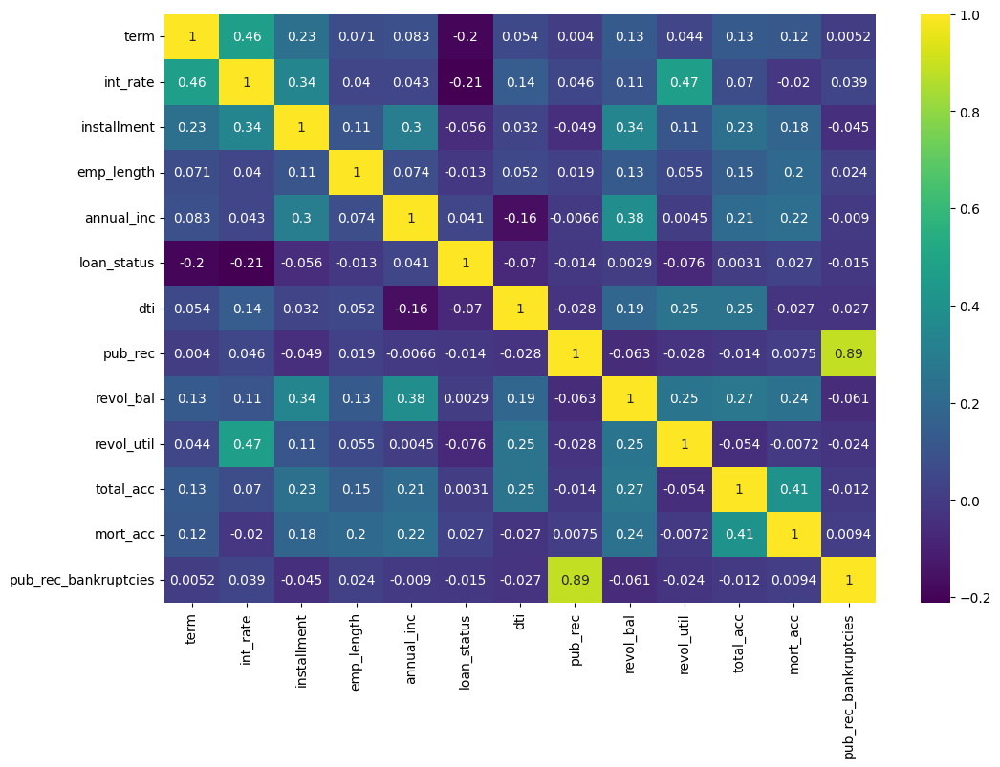

In [89]:
plt.figure(figsize=(12, 8))
sns.heatmap(lc_2012.corr(numeric_only=True), annot=True, cmap='viridis')

Grafico outliers, los cuales no tengo en cuenta 

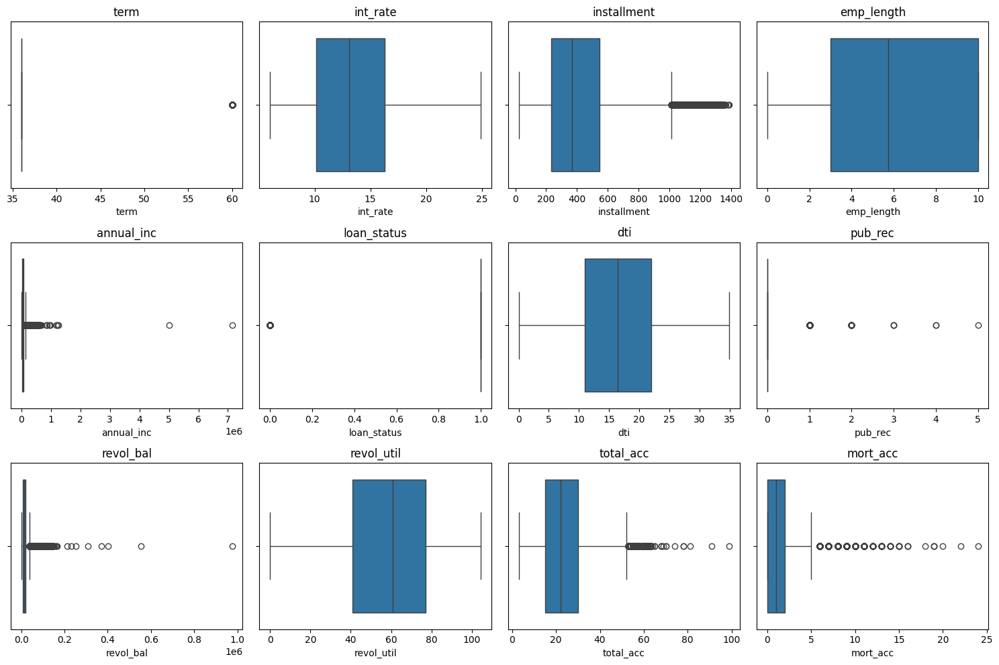

In [90]:

features = ['term', 'int_rate', 'installment', 'emp_length', 'annual_inc',
            'loan_status', 'dti', 'pub_rec', 'revol_bal', 'revol_util',
            'total_acc', 'mort_acc']

# Configuración del tamaño de la figura
plt.figure(figsize=(15, 10))

# Crear boxplots para cada feature
for i, feature in enumerate(features, 1):
    plt.subplot(3, 4, i)  # 3 filas, 4 columnas
    sns.boxplot(x=lc_2012[feature])
    plt.title(feature)

# Ajustar el diseño
plt.tight_layout()

# Mostrar los boxplots
plt.show()

In [91]:
# OJO PARA BALANCEAR LA MUESTRA, al estar las instancias en mas del 80% dando como resultado en la target, 1 Fully Paid.

from sklearn.utils import resample


lc_2012_majority = lc_2012[lc_2012['loan_status'] == 1]
lc_2012_minority = lc_2012[lc_2012['loan_status'] == 0]

lc_2012_majority_downsampled = resample(lc_2012_majority, replace=False, n_samples=len(lc_2012_minority), random_state=42)

lc_2012_balanced = pd.concat([lc_2012_majority_downsampled, lc_2012_minority])

Compruebo que la muestra esta balanceada y se ha achicado.

In [92]:
lc_2012_balanced['loan_status'].value_counts(normalize=True)

loan_status
1    0.5
0    0.5
Name: proportion, dtype: float64

In [93]:
lc_2012_balanced['loan_status'].value_counts()

loan_status
1    6781
0    6781
Name: count, dtype: int64

In [94]:
lc_2012_balanced.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13562 entries, 331927 to 395941
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   term                  13562 non-null  int64  
 1   int_rate              13562 non-null  float64
 2   installment           13562 non-null  float64
 3   emp_title             12666 non-null  object 
 4   emp_length            13562 non-null  float64
 5   home_ownership        13562 non-null  object 
 6   annual_inc            13562 non-null  float64
 7   loan_status           13562 non-null  int64  
 8   purpose               13562 non-null  object 
 9   dti                   13562 non-null  float64
 10  pub_rec               13562 non-null  float64
 11  revol_bal             13562 non-null  float64
 12  revol_util            13562 non-null  float64
 13  total_acc             13562 non-null  float64
 14  initial_list_status   13562 non-null  object 
 15  mort_acc          

Veo que hay 896 instancias sin oficio declarado(que lo hago asi porque pensaba discretizar la categórica), pero luego chequeo que hay además de estos null, 11053 profesiones(empleos-trabajos) diferentes, cuando tengo una muestra de 13562, por lo que determino desprenderme de esta feature.

In [95]:

lc_2012['emp_title'].fillna('oficio no declarado', inplace=True)

In [96]:
(lc_2012_balanced['emp_title'] == 'oficio no declarado').sum()

0

In [97]:
len(lc_2012_balanced.emp_title.unique())

11053

In [98]:
lc_2012_balanced = lc_2012_balanced.drop(['emp_title'],axis=1)

In [99]:
lc_2012_balanced.head()

,term,int_rate,installment,emp_length,home_ownership,annual_inc,loan_status,purpose,dti,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mort_acc,pub_rec_bankruptcies
331927,36,13.11,337.47,9.0,RENT,78000.0,1,credit_card,26.15,0.0,7532.0,77.6,23.0,f,0.0,0.0
245230,36,13.11,101.25,10.0,MORTGAGE,95000.0,1,medical,28.07,0.0,58095.0,82.4,50.0,f,4.0,0.0
354034,36,13.11,337.47,2.0,RENT,50000.0,1,credit_card,24.31,0.0,44558.0,83.0,22.0,f,0.0,0.0
309471,36,12.12,399.26,1.0,MORTGAGE,66500.0,1,debt_consolidation,10.72,0.0,36033.0,67.7,21.0,f,2.0,0.0
62727,36,12.12,440.85,10.0,RENT,55000.0,1,debt_consolidation,7.48,0.0,9487.0,66.8,18.0,w,0.0,0.0


Como veo que primero están los fully paid, mezclo la muestra.

In [100]:
lc_2012_balmix = lc_2012_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

In [101]:
lc_2012_balmix

,term,int_rate,installment,emp_length,home_ownership,annual_inc,loan_status,purpose,dti,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mort_acc,pub_rec_bankruptcies
0,36,13.99,410.08,6.000000,RENT,45000.00,1,debt_consolidation,23.17,0.0,4997.0,76.9,23.0,f,0.000000,0.0
1,36,20.49,823.11,7.000000,RENT,50000.00,1,debt_consolidation,26.33,0.0,23535.0,75.2,24.0,f,0.000000,0.0
2,36,8.90,171.47,0.000000,RENT,56000.00,0,small_business,4.80,0.0,7138.0,38.8,16.0,f,4.000000,0.0
3,36,14.09,400.39,3.000000,RENT,182000.00,0,small_business,12.06,1.0,8277.0,55.2,21.0,f,0.000000,0.0
4,60,13.11,547.43,7.000000,MORTGAGE,91851.84,0,credit_card,16.89,0.0,8669.0,30.4,37.0,f,13.000000,0.0
5,36,14.33,253.25,3.000000,MORTGAGE,40000.00,0,debt_consolidation,27.09,0.0,16155.0,64.1,27.0,f,4.000000,0.0
6,36,18.55,546.44,10.000000,OWN,54600.00,0,debt_consolidation,6.18,0.0,7398.0,62.0,31.0,f,0.000000,0.0
7,60,22.95,985.67,0.000000,MORTGAGE,76000.00,0,debt_consolidation,14.61,0.0,30962.0,77.1,35.0,f,3.000000,0.0
8,36,13.11,121.49,5.000000,RENT,70000.00,0,debt_consolidation,3.31,0.0,2301.0,21.3,10.0,f,0.000000,0.0
9,36,13.67,272.15,8.000000,RENT,30160.00,1,debt_consolidation,5.93,0.0,5442.0,76.6,9.0,f,0.000000,0.0


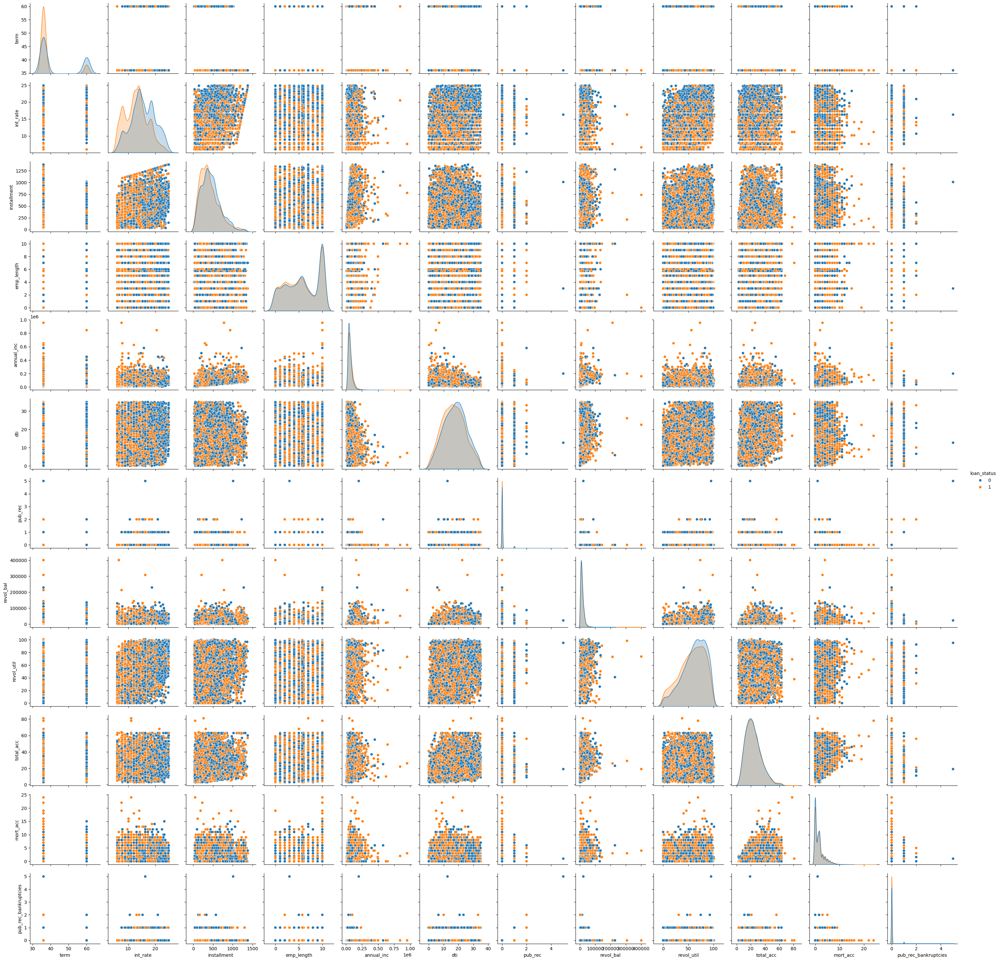

In [102]:
sns.pairplot(lc_2012_balmix, hue="loan_status")

<Axes: >

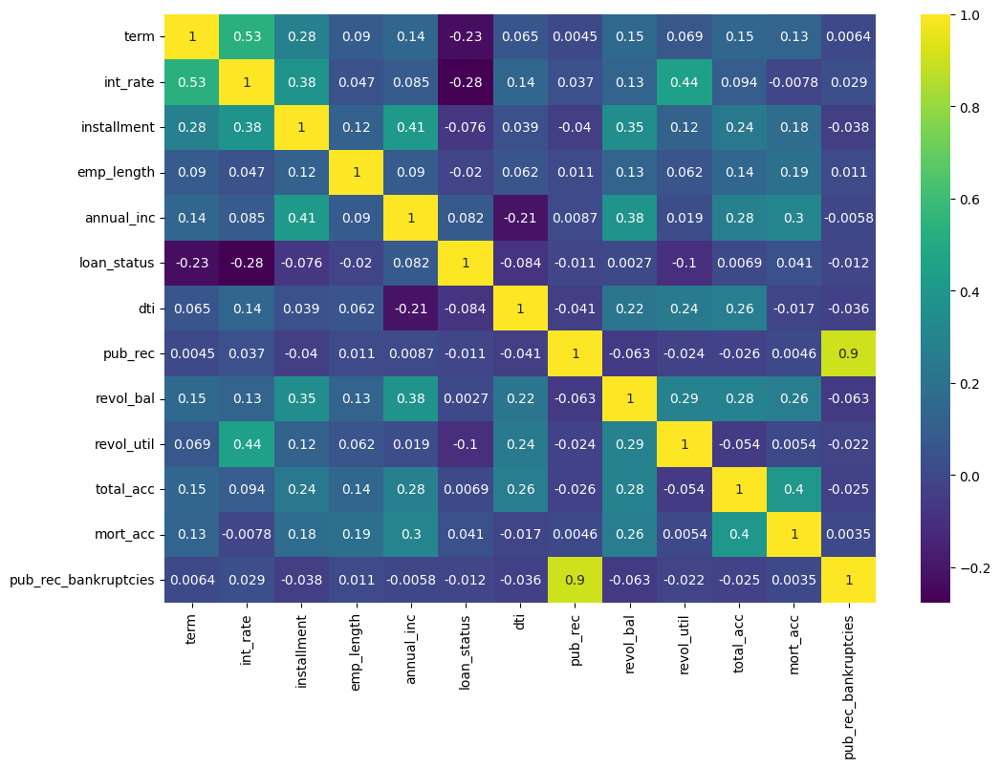

In [103]:
plt.figure(figsize=(12, 8))
sns.heatmap(lc_2012_balmix.corr(numeric_only=True), annot=True, cmap='viridis')

Los cambios abajo comentados, los hice, para ver como se comportaba el modelo logreg, cambiando la target, de 0 a 1, y los 1 a 0, siendo el resultado, levemente inferior, pero la perdida en Recall(instancias positivas correctamente identificadas por el modelo) no compensaba la ganancia de Precision(proporcion de instacias positivas predichas que son correctas). Y si pensamos que habia cambiado los 0 por los 1, no a lugar mantener el cambio.

In [104]:

#CAMBIO LOS 0 POR LOS 1 Y VICEVERSA
# lc_2012_balmix['loan_status'] = lc_2012_balmix['loan_status'].replace({0: 1, 1: 0})

In [105]:
# sns.pairplot(lc_2012_balmix, hue="loan_status")

In [106]:
# lc_2012_balmix.to_csv('lc_2012_balmix01.csv', index=False)

Grafico los outliers, aunque no los he tenido en cuenta para este estudio

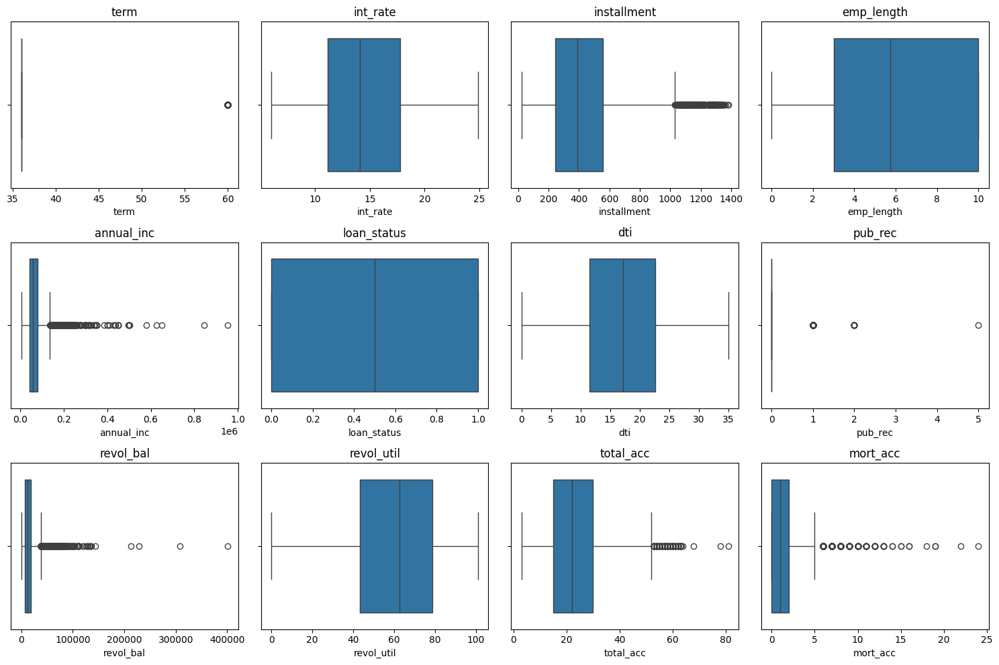

In [107]:
features = ['term', 'int_rate', 'installment', 'emp_length', 'annual_inc',
            'loan_status', 'dti', 'pub_rec', 'revol_bal', 'revol_util',
            'total_acc', 'mort_acc']

# Configuración del tamaño de la figura
plt.figure(figsize=(15, 10))

# Crear boxplots para cada feature
for i, feature in enumerate(features, 1):
    plt.subplot(3, 4, i)  # 3 filas, 4 columnas
    sns.boxplot(x=lc_2012_balmix[feature])
    plt.title(feature)

# Ajustar el diseño
plt.tight_layout()

# Mostrar los boxplots
plt.show()

In [108]:
# # Calcular los límites del bigote en el boxplot
# Q1 = lc_2012['revol_util'].quantile(0.25)
# Q3 = lc_2012['revol_util'].quantile(0.75)
# IQR = Q3 - Q1

# # Definir los límites de los outliers
# lower_bound = Q1 - 1.5 * IQR
# upper_bound = Q3 + 1.5 * IQR

# # Identificar los outliers
# outliers = lc_2012[(lc_2012['revol_util'] < lower_bound) | (lc_2012['revol_util'] > upper_bound)]

# # Mostrar los outliers
# print("Outliers en 'revol_util':")
# print(outliers['revol_util'])

In [109]:


# OJO TRANSFORMACION LOGARITMICA???????



# # Lista de features
# features = ['term', 'int_rate', 'installment', 'emp_length', 'annual_inc',
#             'loan_status', 'dti', 'pub_rec', 'revol_bal', 'revol_util',
#             'total_acc', 'mort_acc']

# # Aplicar la transformación logarítmica a los features
# lc_2012_log = lc_2012_balanced[features].apply(lambda x: np.log1p(x) if np.issubdtype(x.dtype, np.number) else x)

# # Configuración del tamaño de la figura
# plt.figure(figsize=(15, 10))

# # Crear boxplots para cada feature después de la transformación logarítmica
# for i, feature in enumerate(features, 1):
#     plt.subplot(3, 4, i)  # 3 filas, 4 columnas
#     sns.boxplot(x=lc_2012_log[feature])
#     plt.title(f'{feature} (Logarithmic Transformation)')

# # Ajustar el diseño
# plt.tight_layout()

# # Mostrar los boxplots
# plt.show()

In [110]:
# lc_2012_balmix01 = lc_2012_balmix.copy()


In [111]:
df_new

,emp_title,emp_length,home_ownership,purpose,pub_rec,total_acc,initial_list_status,mort_acc,pub_rec_bankruptcies
0,30985,12,5,13,6,71,2,23,5


La última transformación que realizo es la de a las siguientes features, que pueden ver arriba de esto, aparecen sus valores únicos, salvo term(que tiene 2 valores únicos, 36 y 60):

term: Plazo del préstamo en meses.

emp_length: Antigüedad laboral del prestatario en años.

home_ownership: Estado de propiedad de la vivienda del prestatario (RENT, OWN, MORTGAGE, OTHER).

purpose: Propósito del préstamo.

pub_rec: Número de registros públicos desfavorables.

total_acc: Número total de cuentas de crédito del prestatario.

initial_list_status: Estado inicial de la lista del préstamo (W, F).

mort_acc: Número de cuentas hipotecarias.

pub_rec_bankruptcies: Número de quiebras en los registros públicos.

Y LO QUE les hago es traspasar a cada categoría su predisposición a ser 1 o 0, mediante las medias de la columna target, de cada una de esas categorías.


In [112]:
medias_pub_rec_bankruptcies = lc_2012_balmix.groupby('pub_rec_bankruptcies')['loan_status'].mean()

# Asignar las medias de la target a las filas correspondientes
lc_2012_balmix['pub_rec_bankruptcies'] = lc_2012_balmix['pub_rec_bankruptcies'].map(medias_pub_rec_bankruptcies)

medias_mort_acc = lc_2012_balmix.groupby('mort_acc')['loan_status'].mean()

# Asignar las medias de target a las filas correspondientes
lc_2012_balmix['mort_acc'] = lc_2012_balmix['mort_acc'].map(medias_mort_acc)


medias_initial_list_status = lc_2012_balmix.groupby('initial_list_status')['loan_status'].mean()

# Asignar las medias de la target a las filas correspondientes
lc_2012_balmix['initial_list_status'] = lc_2012_balmix['initial_list_status'].map(medias_initial_list_status)


medias_total_acc = lc_2012_balmix.groupby('total_acc')['loan_status'].mean()

# Asignar las medias de la target a las filas correspondientes
lc_2012_balmix['total_acc'] = lc_2012_balmix['total_acc'].map(medias_total_acc)


medias_pub_rec = lc_2012_balmix.groupby('pub_rec')['loan_status'].mean()

# Asignar las medias de la target a las filas correspondientes
lc_2012_balmix['pub_rec'] = lc_2012_balmix['pub_rec'].map(medias_pub_rec)


medias_purpose = lc_2012_balmix.groupby('purpose')['loan_status'].mean()

# Asignar las medias de la target a las filas correspondientes
lc_2012_balmix['purpose'] = lc_2012_balmix['purpose'].map(medias_purpose)



medias_emp_length = lc_2012_balmix.groupby('emp_length')['loan_status'].mean()

# Asignar las medias de la target a las filas correspondientes
lc_2012_balmix['emp_length'] = lc_2012_balmix['emp_length'].map(medias_emp_length)


medias_home_ownership = lc_2012_balmix.groupby('home_ownership')['loan_status'].mean()

# Asignar las medias de la target a las filas correspondientes
lc_2012_balmix['home_ownership'] = lc_2012_balmix['home_ownership'].map(medias_home_ownership)


medias_term = lc_2012_balmix.groupby('term')['loan_status'].mean()

# Asignar las medias de la target a las filas correspondientes
lc_2012_balmix['term'] = lc_2012_balmix['term'].map(medias_term)


In [389]:
lc_2012_balmix.head()

,term,int_rate,installment,emp_length,home_ownership,annual_inc,loan_status,purpose,dti,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mort_acc,pub_rec_bankruptcies
0,0.560763,13.99,410.08,0.493506,0.479546,45000.00,1,0.473215,23.17,0.500914,4997.0,76.9,0.506958,0.498455,0.483154,0.500871
1,0.560763,20.49,823.11,0.479567,0.479546,50000.00,1,0.473215,26.33,0.500914,23535.0,75.2,0.502101,0.498455,0.483154,0.500871
2,0.560763,8.90,171.47,0.502326,0.479546,56000.00,0,0.389011,4.80,0.500914,7138.0,38.8,0.479532,0.498455,0.541608,0.500871
3,0.560763,14.09,400.39,0.528529,0.479546,182000.00,0,0.389011,12.06,0.472684,8277.0,55.2,0.492647,0.498455,0.483154,0.500871
4,0.273930,13.11,547.43,0.479567,0.523856,91851.84,0,0.581884,16.89,0.500914,8669.0,30.4,0.500000,0.498455,0.600000,0.500871


<Axes: >

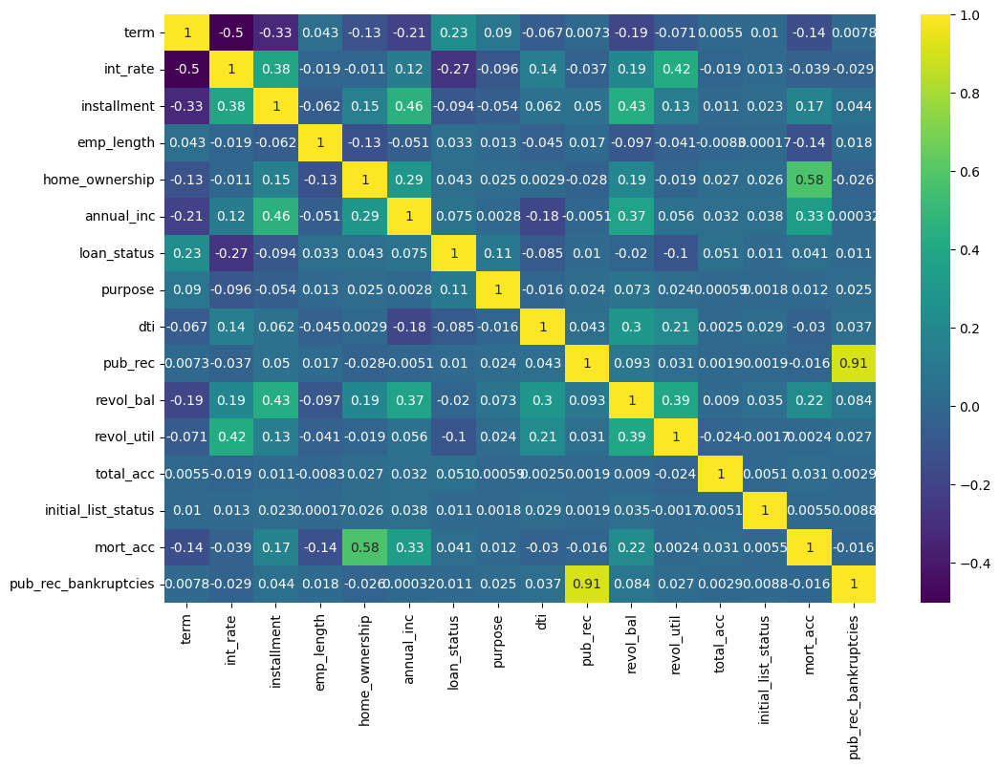

In [390]:
plt.figure(figsize=(12, 8))
sns.heatmap(lc_2012_balmix.corr(method= 'spearman', numeric_only=True), annot=True, cmap='viridis')

Para terminar creo los datasets finales, donde bal es por estar balanceado(0 y 1),

 mix, porque estan repartidos aleatoriamente las filas de 1 y 0, en la muestra,

 y cat_mean, por haber aplicado la transformación de las medias a las categorías, anteriormente descrita

In [391]:
# X_balmix01= lc_2012_balmix.drop(['loan_status'], axis=1)
X_balmix_cat_mean= lc_2012_balmix.drop(['loan_status'], axis=1)

In [393]:
# y_balmix01 = lc_2012_balmix.drop(['term','int_rate','installment','emp_length','annual_inc','dti','pub_rec','revol_bal','revol_util','total_acc','mort_acc'], axis=1)
y_balmix_cat_mean= lc_2012_balmix.drop(['term','int_rate','installment','emp_length','home_ownership','annual_inc','purpose','dti','pub_rec','revol_bal','revol_util','total_acc','initial_list_status','mort_acc','pub_rec_bankruptcies'], axis=1)

In [394]:

X_balmix_cat_mean.to_csv('../data/processed/X_balmix_cat_mean.csv', index=False)
y_balmix_cat_mean.to_csv('../data/processed/y_balmix_cat_mean.csv', index=False)